# Data Exploration

## Import packages

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium import plugins
plt.rcParams['figure.facecolor'] = 'white'

## Load data
- US Accidents data set, retrieved from [kaggle](https://www.kaggle.com/code/satyabrataroy/60-insights-extraction-us-accident-analysis)
- US Poupulation 2022, retreived from [worldpopulationreview](https://worldpopulationreview.com/states)

In [4]:
# read the accident, holiday, population and state data
accidents = pd.read_csv('US_Accidents_Dec21_updated.csv', sep=',')
holidays = pd.read_csv('US_Holidays_(2004-2021).csv', sep=',')
population = pd.read_csv('population.csv', sep=',')
population = population[['state', 'pop2022']] # only keep the state and population columns
states = pd.read_csv('state_mapping.csv', sep=',').drop('Unnamed: 0', axis=1) # used to get state abbreviations
population = pd.merge(population, states, left_on='state', right_on='State').drop(columns=['state', 'Population'])
print("Accidents dataset shape: ", accidents.shape)
print("Population dataset shape: ", population.shape)

Accidents dataset shape:  (2845342, 47)
Population dataset shape:  (50, 3)


## Feature engineering date columns

In [5]:
accidents['Date'] = pd.to_datetime(accidents['Start_Time']).dt.date
accidents['Year'] = pd.to_datetime(accidents['Start_Time']).dt.year
accidents['Month'] = pd.to_datetime(accidents['Start_Time']).dt.month
accidents['Day_of_Week'] = pd.to_datetime(accidents['Start_Time']).dt.dayofweek
accidents['Hour'] = pd.to_datetime(accidents['Start_Time']).dt.hour
print("Start date: ", min(accidents['Date']), ", End date: ", max(accidents['Date']))

Start date:  2016-01-14 , End date:  2021-12-31


## Initial data exploration
**How many accidents happen per day on average in the US?**

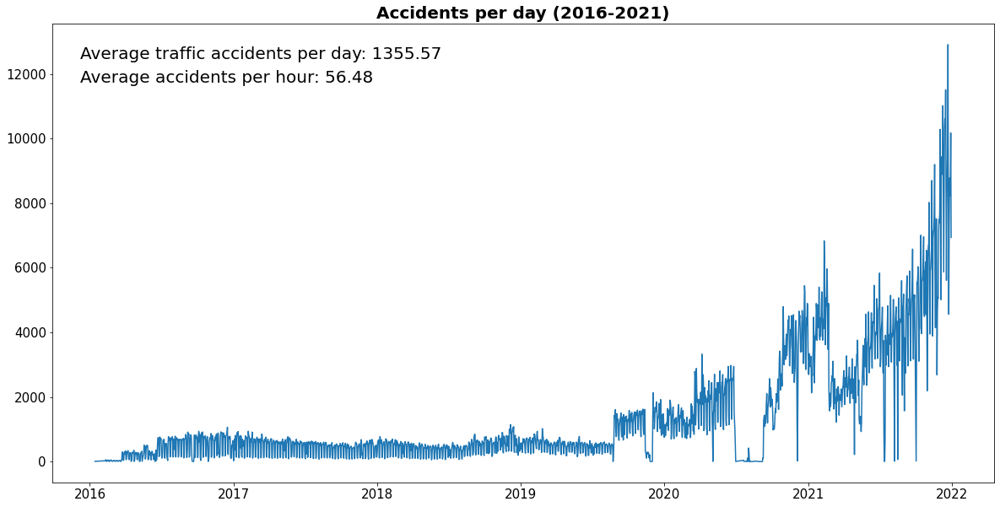

In [12]:
# plot the distribution of accidents by date
accidents.groupby('Date').size().plot(figsize=(20,10))
plt.title('Accidents per day (2016-2021)', fontsize=20, fontweight='bold')
plt.xticks(fontsize=15)
plt.xlabel('')
plt.yticks(fontsize=15)
# calculate the average number of accidents per day and add to the plot as a metric in the upper left hand corner in a box
avg_d = accidents.groupby('Date').size().mean()
plt.text(0.03, 0.95, 'Average traffic accidents per day: ' + str(round(avg_d, 2)), transform=plt.gca().transAxes, fontsize=20, verticalalignment='top')
# calculate the average number of accidents per hour and add to the plot as a metric in the upper left hand corner in a box
avg_h = avg_d/24
plt.text(0.03, 0.90, 'Average accidents per hour: ' + str(round(avg_h, 2)), transform=plt.gca().transAxes, fontsize=20, verticalalignment='top')
plt.show()

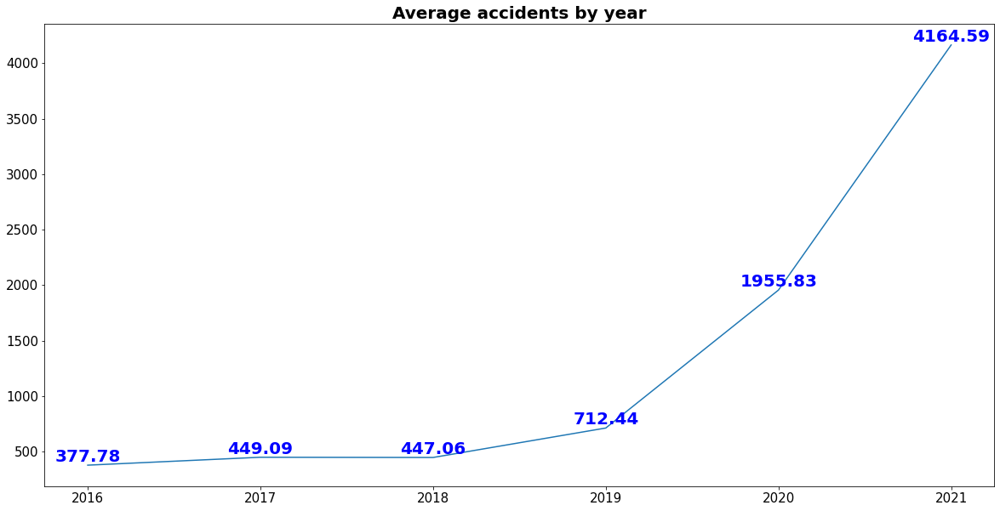

In [13]:
# for each year calculate the average number of accidents per year 
accidents.groupby(['Year', 'Date']).size().groupby('Year').mean().plot(figsize=(20,10))
plt.title('Average accidents by year', fontsize=20,fontweight='bold')
plt.xticks(fontsize=15)
plt.xlabel('')
plt.yticks(fontsize=15)

# add labels to the plot for the average number of accidents per day
for i, v in accidents.groupby(['Year', 'Date']).size().groupby('Year').mean().iteritems():
    plt.text(i, v, str(round(v, 2)), color='blue', fontweight='bold', fontsize=20, horizontalalignment='center', verticalalignment='bottom')
plt.show()

Clearly, the dataset is skewed - the number of data records remain stable from 2016 to mid 2019, whereafter the dataset increases in size until the end of 2021. This doesn't necessarily mean that the number of accidents has just sky rockected all of a sudden, but rather that accidents have been recorded more systematically compared to previous years. We can conclude, however, that most data is generated during 2021 and thus might be representative for further analysis. 

**What are the top 10 states with the most traffic accidents?**

Text(0.5, 1.0, 'Top 10 states with the highest percentage of accidents')

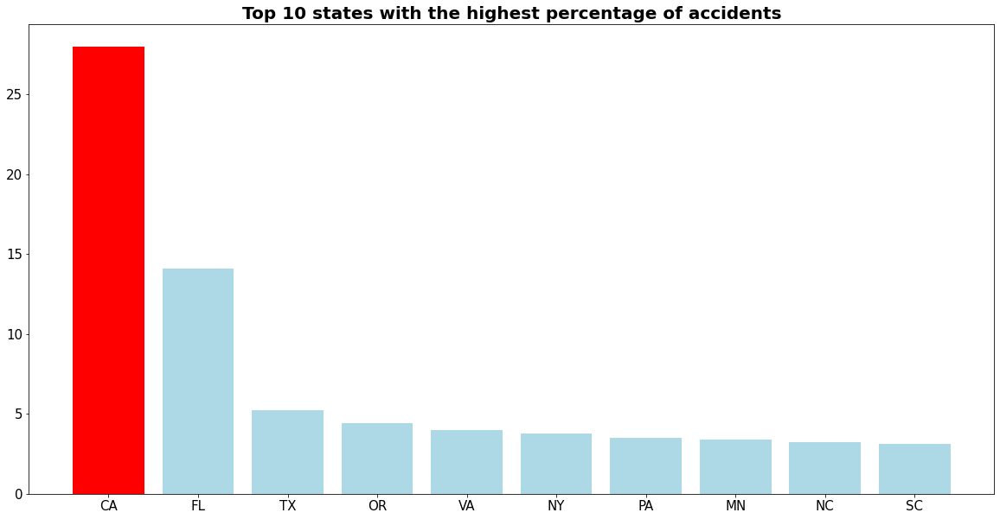

In [18]:
# calculate the top 10 states with the highest number of accidents
temp = accidents.groupby(['State']).size().reset_index(name='counts')
temp['Percent_of_Total'] = temp['counts'] / temp['counts'].sum() * 100
temp = temp.sort_values(by='Percent_of_Total', ascending=False).head(10)

# plot using matplotlib
plt.figure(figsize=(20,10))
plt.bar(temp['State'], temp['Percent_of_Total'])

# make the bar with the highest value red and the rest light blue
plt.bar(temp['State'].iloc[0], temp['Percent_of_Total'].iloc[0], color='red')
plt.bar(temp['State'].iloc[1:], temp['Percent_of_Total'].iloc[1:], color='lightblue')

# add labels
plt.title('Top 10 states with the highest percentage of accidents')
plt.xlabel('State')
plt.ylabel('Percentage of total accidents')
plt.xticks(fontsize=15)
plt.xlabel('')
plt.ylabel('')
plt.yticks(fontsize=15)

# make title larger and axis labels larger
plt.title('Top 10 states with the highest percentage of accidents', fontsize=20, fontweight='bold')



In [16]:
temp['Percent_of_Total'].head()

3     27.970908
8     14.106846
41     5.237929
35     4.440275
43     3.990206
Name: Percent_of_Total, dtype: float64

The above results show that California and Florida have the highest amount of recorded accidents during the period 2016-2021. While this may indicate that more accidents occur in those states compared to others, it may also be that they record accidents more systematically. In addition to this, it may also be more representative to look at the number of accidents per capita. Below, we merge population data for 2022 with the accidents dataset and continue our analysis to understand if the distribution changes. 

**What state has the highest/least traffic accidents per capita in 2021?**

In [19]:
# summarize accidents by state
state_count = pd.DataFrame(accidents['State'].value_counts()).reset_index()
state_count.columns = ['State', 'Accidents']
# merge with population data on state columns
state_count = pd.merge(state_count,population, left_on='State', right_on='Postal').drop(columns=['State_x'])
state_count.columns = ['accidents', 'population_2022', 'state','state_cd']
# calculate number of accidents per 100k population for each state
state_count['accidents_per_100k'] = state_count['accidents'] / state_count['population_2022'] * 100000
state_count = state_count.sort_values(by='accidents_per_100k', ascending=False)
state_count = state_count.reset_index().drop(columns=['index'])
state_count.head()

,accidents,population_2022,state,state_cd,accidents_per_100k
0,126341,4318492,Oregon,OR,2925.581430
1,795868,39995077,California,CA,1989.914909
2,401388,22085563,Florida,FL,1817.422540
3,89216,5217037,South Carolina,SC,1710.089463
4,97185,5787008,Minnesota,MN,1679.365226


In [20]:
# plot heatmap of accidents per state using state_count dataframe 
# import pio and set default renderer to notebook
import plotly.io as pio

pio.renderers.default = "notebook"
fig = px.choropleth(state_count, locations="state_cd", color="accidents_per_100k",
                    locationmode="USA-states", scope="usa",
                    color_continuous_scale=px.colors.sequential.YlOrRd)
fig.update_layout(title_text='Accidents per 100k population')
fig.show()

From above plot we observe that Oregon has the highest rate of accidents per 100k population 2,925, while South Dakota has the smallest (22).
With this information, we decide to zoom in on the state Oregon.

**Zooming in on Oregon and South Dakota, let's understand the distribution of accidents accross cities in each of the states**

In [21]:
# first, let's reduce the amount of data we work with by filtering on Oregon and South Dakota
or_acc = accidents[(accidents['State'] == 'OR')].groupby(['City', 'Year']).size().reset_index(name="year_count")
sd_acc = accidents[(accidents['State'] == 'SD')].groupby(['City', 'Year']).size().reset_index(name="year_count")

**Oregon**

Text(0, 0.5, 'Number of accidents')

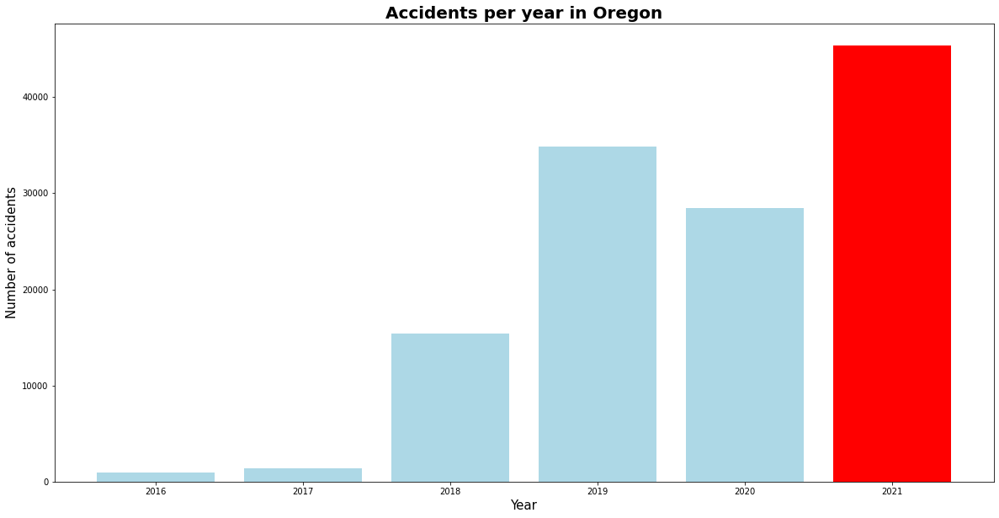

In [22]:
oregon21 = or_acc.groupby('Year').sum()
# plot the number of accidents per year in Oregon using matplotlib
plt.figure(figsize=(20,10))
plt.bar(oregon21.index, oregon21['year_count'])
plt.title('Accidents per year in Oregon', fontsize=20, fontweight='bold')
# make the 2021 bar red and the rest light blue
plt.bar(oregon21.index[5], oregon21['year_count'].iloc[5], color='red')
plt.bar(oregon21.index[0:5], oregon21['year_count'].iloc[0:5], color='lightblue')

# add labels
plt.xlabel('Year', fontsize=15)
plt.ylabel('Number of accidents', fontsize=15)


We see a spike in accidents in 2021 in Oregon - let's further investigate what cities contributed to this

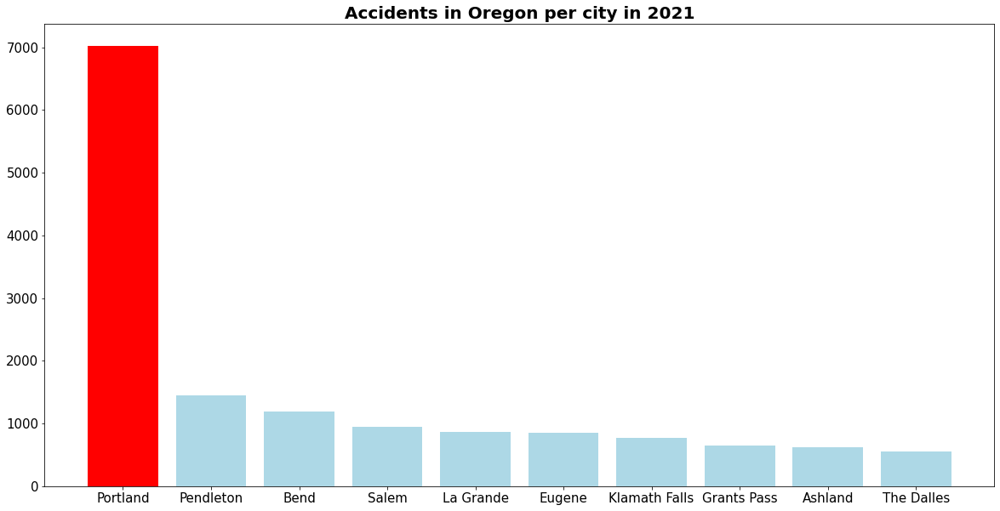

In [24]:
# plot accidents in Oregon per city in 2021
or_acc_2021 = or_acc[or_acc['Year'] == 2021]
or_acc_2021 = or_acc_2021.sort_values(by='year_count', ascending=False)
or_acc_2021 = or_acc_2021.reset_index().drop(columns=['index'])
or_acc_2021 = or_acc_2021.head(10)

# plot accidents in Oregon per city in 2021
plt.figure(figsize=(20,10))
plt.bar(or_acc_2021['City'], or_acc_2021['year_count'])
plt.xlabel('')
plt.ylabel('')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# make the bar with the highest value red and the rest light blue
plt.bar(or_acc_2021['City'].iloc[0], or_acc_2021['year_count'].iloc[0], color='red')
plt.bar(or_acc_2021['City'].iloc[1:], or_acc_2021['year_count'].iloc[1:], color='lightblue')

plt.title('Accidents in Oregon per city in 2021', fontsize=20, fontweight='bold')
plt.show()

Accidents are clearly very high in the city Portland. Let's zoom in on Portland to get a better view of where the accidents actually happen.

In [26]:
# save accidents to csv
accidents_port = accidents[(accidents['City'] == 'Portland') & (accidents['Year'] == 2021)]
accidents_port.to_csv('Portland2021.csv', index=False)

In [27]:
m = folium.Map([45.5230, -122.6764], zoom_start=11,tiles='Stamen Terrain') # center of portland
locations = list(zip(accidents_port.Start_Lat, accidents_port.Start_Lng))

cluster = plugins.MarkerCluster(locations=locations, name="Cluster",   # use cities as clusters                  
               popups=accidents_port["City"].tolist())

heatmap = plugins.HeatMap(locations, min_opacity=0.4, blue=18, name="Heatmap")

folium.FeatureGroup()
cluster.add_to(m)
heatmap.add_to(m)
#m.add_child(cluster)

folium.LayerControl().add_to(m)

m

From the above interactive plot, we can observe that most accidents are recorded in the city center. We can also see that a lot of the accidents occour on the highways leading to the centre of the city. Furthermore, we can observe different 'hotspots' where a lot of accidents have happened at specific intersections.

In the dataset we have a variable called 'Severity' which indicate how much the traffic accident has affected the traffic in terms of queues. We can add this on top of our map to understand if there are any interesting differences in severity of the accidents:

In [29]:
# plot accidents_org with Start_Lat and Start_Lng in geo plot 
fig = px.scatter_mapbox(accidents_port, lat="Start_Lat", lon="Start_Lng", hover_name="City", hover_data=["City", "State"],
                        color_discrete_sequence=["fuchsia"], color="Severity" ,zoom=5, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [31]:
accidents['Severity'].value_counts()
#accidents.shape #2845342

2    2532991
3     155105
4     131193
1      26053
Name: Severity, dtype: int64

From Above, it seems that the majority of the accidents are of the category 2, indicating a low severity. This gives rives to concern why the distribution is so homogenous. We plot the distribution of accidents by severity categories, and find that most of the accidents in the whole accidents dataset is of the severity category 2. 

## Severity Analysis
'Severity' feature is ordinal and depicts the severity of an accident in terms of impact on the traffic. 1 indicate a short delay as a result of the accident, and 4 indicates a significant impact on the traffic (i.e., long delay). 

In [104]:
top5 = state_count.head()['state_cd']
top5_states = accidents[accidents['State'].isin(top5)]

In [113]:
acc_by_severity = top5_states.groupby(['State', 'Severity']).size().reset_index(name="severity_count")

# create a new column in acc_by_severity with the percentage of accidents by severity for each state
acc_by_severity['severity_percentage'] = acc_by_severity.groupby('State')['severity_count'].apply(lambda x: 100 * x / float(x.sum()))
    

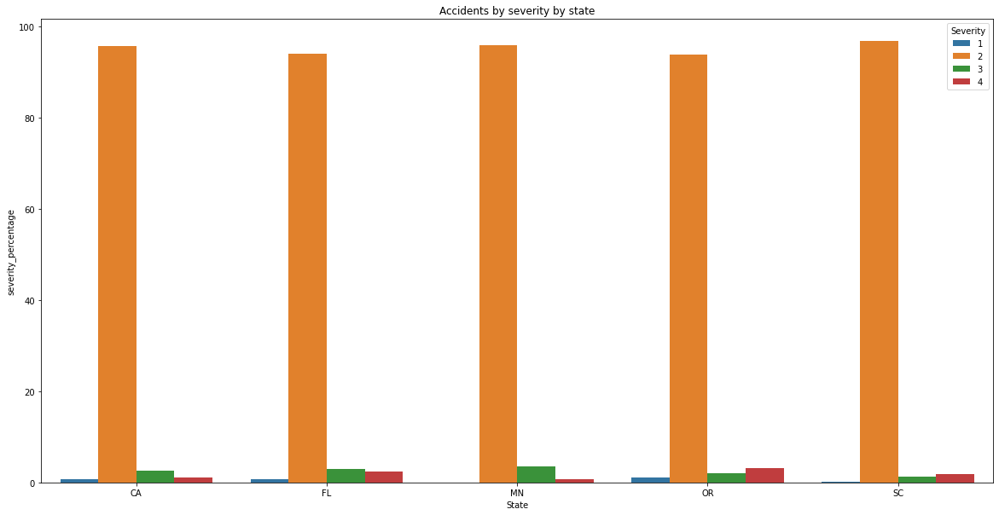

In [114]:
# plot accidents by severity for top 5 states dataframe
plt.figure(figsize=(20,10))
sns.barplot(x='State', y='severity_percentage', hue='Severity', data=acc_by_severity)
plt.title('Accidents by severity by state')
plt.show()